# downaload dataset with segmation mask

In [1]:
# !pip install gdown

Defaulting to user installation because normal site-packages is not writeable


In [2]:

# import gdown
# import zipfile
# import os

# def download_and_extract_from_gdrive(gdrive_url, extract_to="extracted"):
#     # Convert shared drive URL to direct download URL
#     file_id = gdrive_url.split("/d/")[1].split("/")[0]
#     download_url = f"https://drive.google.com/uc?id={file_id}"

#     # Create output folder
#     os.makedirs(extract_to, exist_ok=True)

#     zip_path = os.path.join(extract_to, "downloaded.zip")

#     print("[INFO] Downloading ZIP from Google Drive...")
#     gdown.download(download_url, zip_path, quiet=False)

#     print("[INFO] Extracting ZIP...")
#     with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#         zip_ref.extractall(extract_to)

#     # Optionally, remove the ZIP file after extraction
#     os.remove(zip_path)

#     print(f"[DONE] Extracted files to: {extract_to}")

# # --------- Usage ----------
# gdrive_url = "https://drive.google.com/file/d/1UppumYqYOi-kto6BWPfFxwJK2Eph46oY/view?usp=sharing"
# download_and_extract_from_gdrive(gdrive_url, extract_to="datasets")

/usr/lib/python3/dist-packages/requests/__init__.py:87: RequestsDependencyWarning: urllib3 (2.4.0) or chardet (4.0.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


[INFO] Downloading ZIP from Google Drive...


Downloading...
From (original): https://drive.google.com/uc?id=1UppumYqYOi-kto6BWPfFxwJK2Eph46oY
From (redirected): https://drive.google.com/uc?id=1UppumYqYOi-kto6BWPfFxwJK2Eph46oY&confirm=t&uuid=bbef1189-603e-4d7f-9b24-a9f350cef40e
To: /home/ssl49/Desktop/Automated-Labeling-for-Aerial-Images-main/Automated_SegmentAndYolo/datasets/downloaded.zip
100%|██████████| 4.14G/4.14G [01:11<00:00, 57.7MB/s]


[INFO] Extracting ZIP...
[DONE] Extracted files to: datasets


# convert datasets into yolo format and segmantaion mask

In [3]:
import os
import numpy as np
import xml.etree.ElementTree as ET
from PIL import Image
import json
from tqdm.auto import tqdm

# Class ID to name mapping with RGB values
class_id_to_name = {
    0: ('road', [28, 42, 168]),
    1: ('pool', [0, 50, 89]),
    2: ('vegetation', [107, 142, 35]),
    3: ('roof', [70, 70, 70]),
    4: ('wall', [102, 102, 156]),
    5: ('window', [254, 228, 12]),
    6: ('person', [255, 22, 96]),
    7: ('dog', [102, 51, 0]),
    8: ('car', [9, 143, 150]),
    9: ('bicycle', [119, 11, 32]),
    10: ('tree', [51, 51, 0]),
}

print()


# Path to the dataset
dataset_path = "./datasets/semantic_drone_dataset/training_set"
output_dir = "./datasets/new_dataset"

# Function to parse XML files for bounding boxes (YOLO annotations)
def parse_bbox_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    bboxes = []
    for obj in root.findall('object'):
        class_name = obj.find('name').text
        if class_name in [value[0] for value in class_id_to_name.values()]:  # Only the specified classes
            polygon = obj.find('polygon')
            if polygon is not None:
                points = polygon.findall('pt')
                coords = [(float(pt.find('x').text), float(pt.find('y').text)) for pt in points]
                # Get bounding box (min, max x and y)
                x_min = min([coord[0] for coord in coords])
                y_min = min([coord[1] for coord in coords])
                x_max = max([coord[0] for coord in coords])
                y_max = max([coord[1] for coord in coords])
                bboxes.append(((x_min, y_min), (x_max, y_max), class_name))
    return bboxes

# Function to parse XML files for segmentation polygons (mask annotations)
def parse_segmentation_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    bboxes = []
    for obj in root.findall('object'):
        class_name = obj.find('name').text
        if class_name in [value[0] for value in class_id_to_name.values()]:  # Only the specified classes
            polygon = obj.find('polygon')
            if polygon is not None:
                points = polygon.findall('pt')
                coords = [(float(pt.find('x').text), float(pt.find('y').text)) for pt in points]
                # Get bounding box (min, max x and y)
                x_min = min([coord[0] for coord in coords])
                y_min = min([coord[1] for coord in coords])
                x_max = max([coord[0] for coord in coords])
                y_max = max([coord[1] for coord in coords])
                bboxes.append(((x_min, y_min), (x_max, y_max), class_name))
    return bboxes

# Function to create a segmentation mask based on the class color mapping
def create_segmentation_mask(image_size, bboxes, class_id_to_name):
    segmentation_mask = np.zeros((image_size[0], image_size[1], 3), dtype=np.uint8)
    for (x_min, y_min), (x_max, y_max), class_name in bboxes:
        class_id, class_rgb = next(((cid, rgb) for cid, (name, rgb) in class_id_to_name.items() if name == class_name), (None, None))
        if class_rgb is not None:
            segmentation_mask[int(y_min):int(y_max), int(x_min):int(x_max)] = class_rgb
    return segmentation_mask

# Function to save annotations in YOLO format
def save_yolo_format(image_id, bboxes, image_width, image_height, output_path):
    with open(output_path, 'w') as f:
        for (x_min, y_min), (x_max, y_max), class_name in bboxes:
            class_id = next(cid for cid, (name, _) in class_id_to_name.items() if name == class_name)
            # Normalize bounding box coordinates
            x_center = (x_min + x_max) / 2 / image_width
            y_center = (y_min + y_max) / 2 / image_height
            width = (x_max - x_min) / image_width
            height = (y_max - y_min) / image_height
            f.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

# Loop through all the images in the dataset
image_ids = [img.split('.')[0] for img in os.listdir(f"{dataset_path}/images") if img.endswith(".jpg")]

# Create the output directory structure if it doesn't exist
os.makedirs(f"{output_dir}/images", exist_ok=True)
os.makedirs(f"{output_dir}/segmentation_mask", exist_ok=True)
os.makedirs(f"{output_dir}/labels", exist_ok=True)

# Process each image
for image_id in tqdm(image_ids):
    img_path = f"{dataset_path}/images/{image_id}.jpg"
    xml_bbox_path = f"{dataset_path}/gt/bounding_box/label_me_xml/{image_id}.xml"
    xml_mask_path = f"{dataset_path}/gt/semantic/label_me_xml/{image_id}.xml"

    # Check if image file exists
    if not os.path.exists(img_path):
        print(f"[WARNING] Image not found: {img_path}, skipping...")
        continue

    # Try parsing bounding box and mask annotations
    try:
        bboxes = parse_bbox_xml(xml_bbox_path)  # for YOLO annotation
        mask_boxes = parse_segmentation_xml(xml_mask_path)  # for segmentation mask
    except Exception as e:
        print(f"[WARNING] Skipping image {image_id} due to parse error: {e}")
        continue

    # Load image
    try:
        image = Image.open(img_path)
        image = np.array(image)
    except Exception as e:
        print(f"[WARNING] Could not load image {image_id}: {e}")
        continue

    # Create segmentation mask from polygons
    image_size = image.shape[:2]
    segmentation_mask = create_segmentation_mask(image_size, mask_boxes, class_id_to_name)

    # Save original image
    image_pil = Image.fromarray(image)
    image_pil.save(f"{output_dir}/images/{image_id}.jpg")

    # Save segmentation mask
    segmentation_mask_image = Image.fromarray(segmentation_mask)
    segmentation_mask_image.save(f"{output_dir}/segmentation_mask/{image_id}_segmentation_mask.png")

    # Save YOLO annotations (bounding boxes)
    yolo_annotation_path = f"{output_dir}/labels/{image_id}.txt"
    save_yolo_format(image_id, bboxes, image_size[1], image_size[0], yolo_annotation_path)

    # print(f"✅ Saved: {image_id} (image, mask, annotations)")

print("🚀 Processing completed for all images.")


/home/ssl49/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


 75%|███████▌  | 301/400 [02:23<00:43,  2.25it/s]

[WARNING] Skipping image 389 due to parse error: not well-formed (invalid token): line 1, column 0


100%|██████████| 400/400 [03:09<00:00,  2.11it/s]

🚀 Processing completed for all images.


# Visualizeing images with bounding box and segmentation iamges

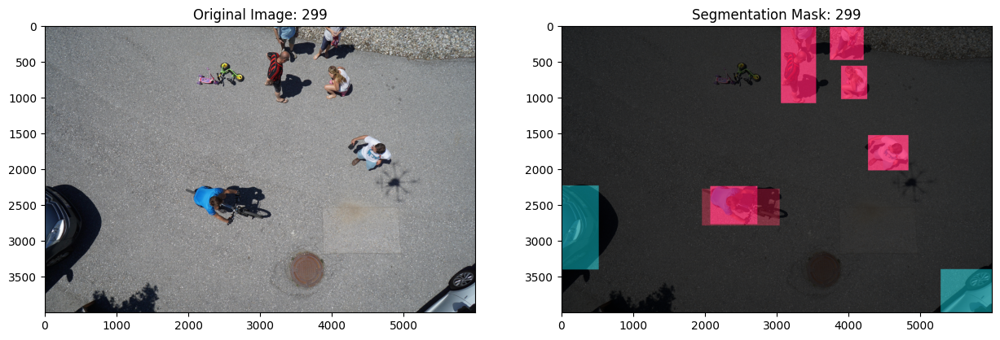

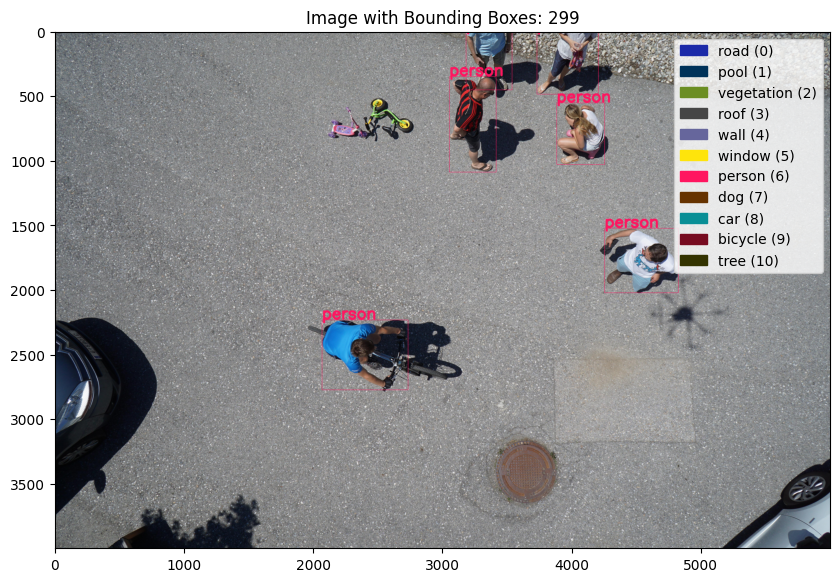

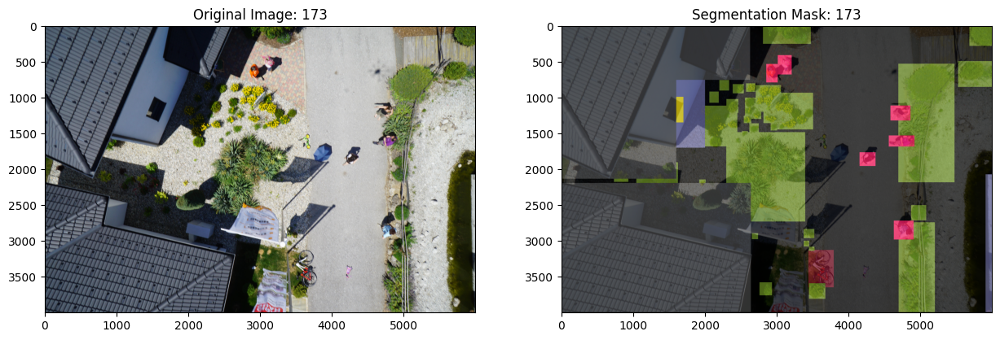

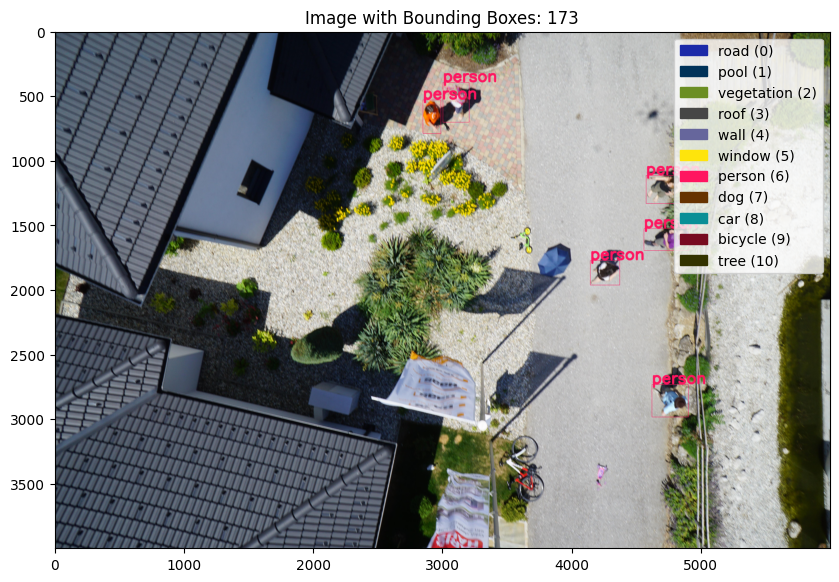

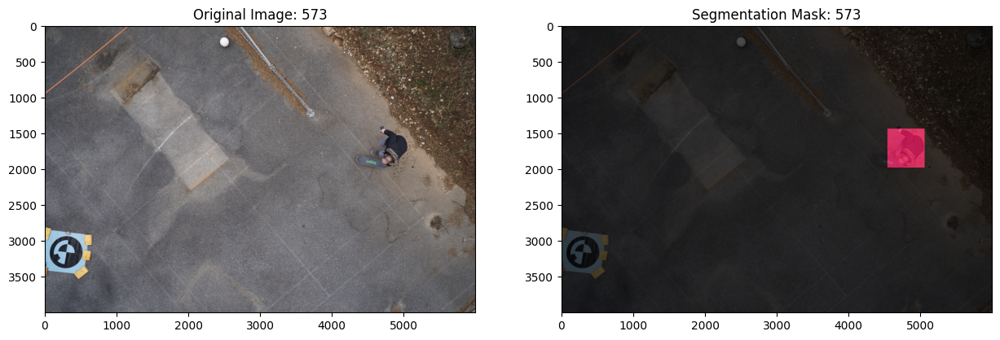

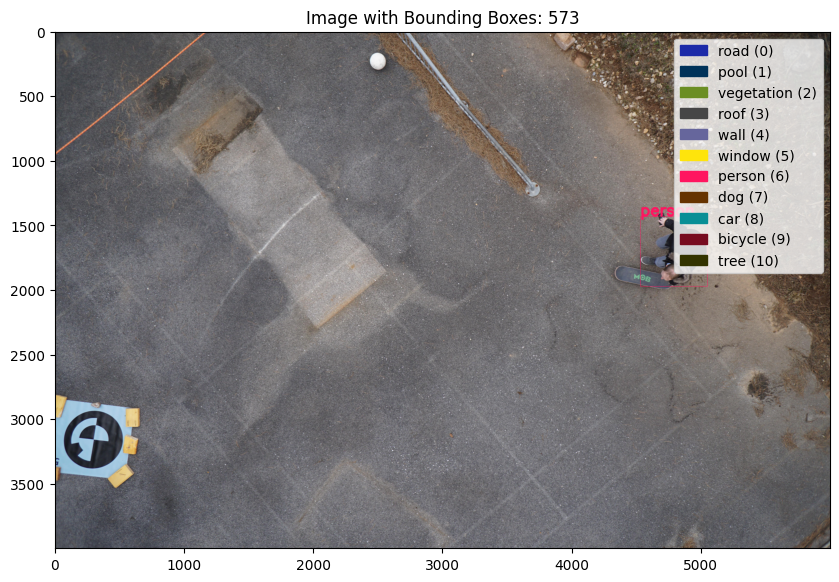

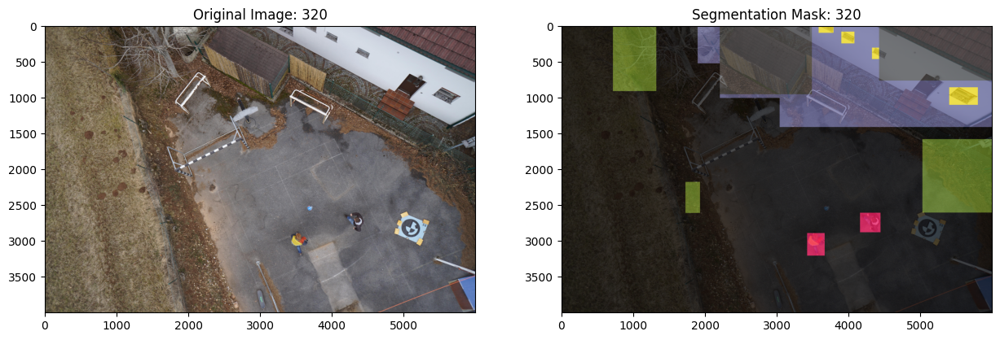

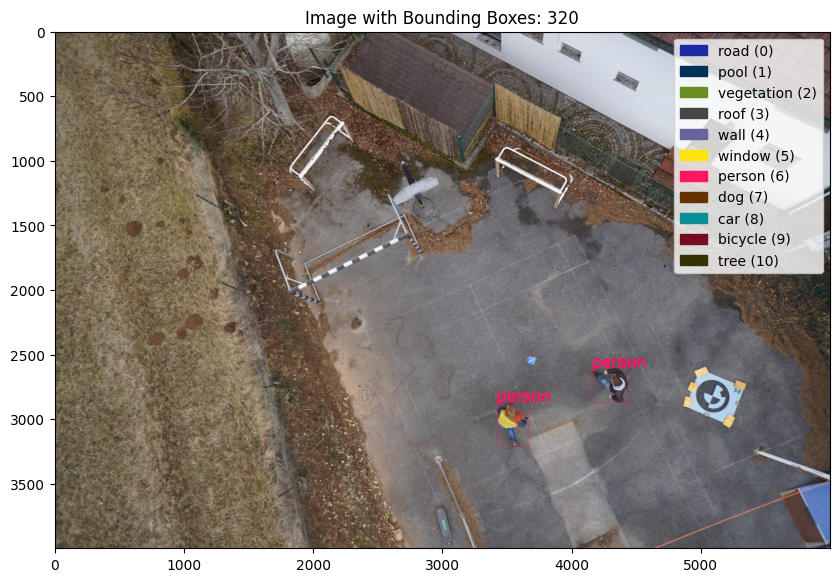

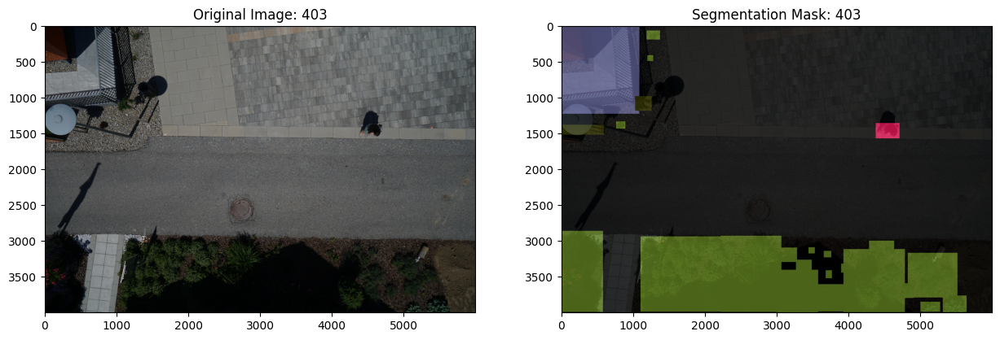

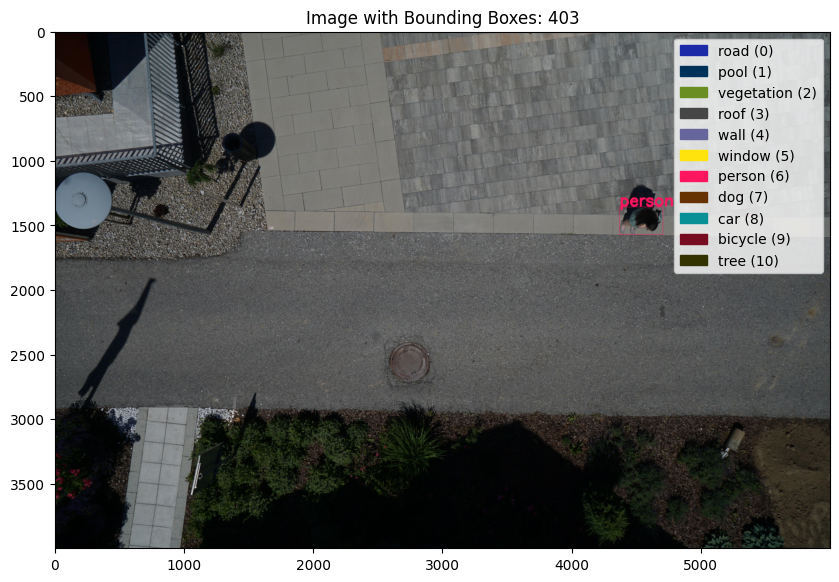

In [4]:
import os
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Path to the dataset
dataset_path = "./datasets/new_dataset"
image_dir = os.path.join(dataset_path, "images")
segmentation_mask_dir = os.path.join(dataset_path, "segmentation_mask")
annotations_dir = os.path.join(dataset_path, "labels")

# Class ID to name mapping with RGB values
class_id_to_name = {
    0: ('road', [28, 42, 168]),
    1: ('pool', [0, 50, 89]),
    2: ('vegetation', [107, 142, 35]),
    3: ('roof', [70, 70, 70]),
    4: ('wall', [102, 102, 156]),
    5: ('window', [254, 228, 12]),
    6: ('person', [255, 22, 96]),
    7: ('dog', [102, 51, 0]),
    8: ('car', [9, 143, 150]),
    9: ('bicycle', [119, 11, 32]),
    10: ('tree', [51, 51, 0]),
}


# Function to load YOLO bounding box annotations
def load_yolo_annotations(anno_file):
    with open(anno_file, 'r') as f:
        lines = f.readlines()
    boxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.split())
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

# Function to visualize the segmentation mask and bounding boxes
def visualize_data(image_id):
    # Load image
    img_path = os.path.join(image_dir, f"{image_id}.jpg")
    segmentation_mask_path = os.path.join(segmentation_mask_dir, f"{image_id}_segmentation_mask.png")
    annotation_path = os.path.join(annotations_dir, f"{image_id}.txt")
    
    if not os.path.exists(img_path) or not os.path.exists(segmentation_mask_path) or not os.path.exists(annotation_path):
        print(f"[WARNING] Missing files for {image_id}, skipping...")
        return

    # Load image and segmentation mask
    image = Image.open(img_path)
    image = np.array(image)
    segmentation_mask = Image.open(segmentation_mask_path)
    segmentation_mask = np.array(segmentation_mask)

    # Load YOLO annotations
    boxes = load_yolo_annotations(annotation_path)

    # Plotting the image with bounding boxes and segmentation mask overlay
    plt.figure(figsize=(15, 10))

    # Plot original image
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Original Image: {image_id}")
    
    # Plot segmentation mask with overlay
    plt.subplot(1, 2, 2)
    plt.imshow(image)
    plt.imshow(segmentation_mask, alpha=0.7)  # Overlay segmentation mask with transparency
    plt.title(f"Segmentation Mask: {image_id}")

    # Draw bounding boxes on the image
    for box in boxes:
        class_id, x_center, y_center, width, height = box
        class_name = class_id_to_name[int(class_id)][0]
        x_min = int((x_center - width / 2) * image.shape[1])
        y_min = int((y_center - height / 2) * image.shape[0])
        x_max = int((x_center + width / 2) * image.shape[1])
        y_max = int((y_center + height / 2) * image.shape[0])

        # Draw bounding box
        color = class_id_to_name[int(class_id)][1]
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 2)
        cv2.putText(image, class_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 4, color, 16)
    
    # Show the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(f"Image with Bounding Boxes: {image_id}")

    # Add color legend to indicate class-to-color mapping
    legend_handles = []
    for class_id, (class_name, class_rgb) in class_id_to_name.items():
        color = np.array(class_rgb) / 255.0  # Normalize to [0, 1] range for plotting
        legend_handles.append(mpatches.Patch(color=color, label=f"{class_name} ({class_id})"))
    
    plt.legend(handles=legend_handles, loc='upper right', fontsize=10)
    plt.show()

# Loop through some example image IDs (you can specify more or iterate through the dataset)
image_ids = [img.split('.')[0] for img in os.listdir(image_dir) if img.endswith(".jpg")]
for image_id in image_ids[:5]:  # Visualizing first 5 images as an example
    visualize_data(image_id)


# Covert into train and val datset

In [5]:
import os
import shutil
import numpy as np
from tqdm.auto import tqdm
from sklearn.model_selection import train_test_split

# Define paths
input_image_dir = "./datasets/new_dataset/images"
input_mask_dir = "./datasets/new_dataset/segmentation_mask"
input_annotation_dir = "./datasets/new_dataset/labels"
output_dir = "./datasets/suitable-dataset"  # New folder for final dataset

# Create directories for the train and val sets
train_image_dir = os.path.join(output_dir, 'train/images')
val_image_dir = os.path.join(output_dir, 'val/images')
train_mask_dir = os.path.join(output_dir, 'train/segmentation_mask')
val_mask_dir = os.path.join(output_dir, 'val/segmentation_mask')
train_annotation_dir = os.path.join(output_dir, 'train/labels')
val_annotation_dir = os.path.join(output_dir, 'val/labels')

os.makedirs(train_image_dir, exist_ok=True)
os.makedirs(val_image_dir, exist_ok=True)
os.makedirs(train_mask_dir, exist_ok=True)
os.makedirs(val_mask_dir, exist_ok=True)
os.makedirs(train_annotation_dir, exist_ok=True)
os.makedirs(val_annotation_dir, exist_ok=True)

# List of all image files in the dataset
image_ids = [img.split('.')[0] for img in os.listdir(input_image_dir) if img.endswith('.jpg')]

# Split the dataset into train and val using a 80-20 split
train_ids, val_ids = train_test_split(image_ids, test_size=0.2, random_state=42)

# Helper function to move files to the appropriate directories
def move_files(file_list, source_image_dir, source_mask_dir, source_annotation_dir,
               target_image_dir, target_mask_dir, target_annotation_dir):
    for image_id in tqdm(file_list, desc="Moving files"):
        image_path = os.path.join(source_image_dir, f"{image_id}.jpg")
        mask_path = os.path.join(source_mask_dir, f"{image_id}_segmentation_mask.png")
        annotation_path = os.path.join(source_annotation_dir, f"{image_id}.txt")

        # Move image file
        if os.path.exists(image_path):
            shutil.copy(image_path, target_image_dir)
        
        # Move segmentation mask file
        if os.path.exists(mask_path):
            shutil.copy(mask_path, target_mask_dir)
        
        # Move YOLO annotation file
        if os.path.exists(annotation_path):
            shutil.copy(annotation_path, target_annotation_dir)

# Move training files
move_files(train_ids, input_image_dir, input_mask_dir, input_annotation_dir,
           train_image_dir, train_mask_dir, train_annotation_dir)

# Move validation files
move_files(val_ids, input_image_dir, input_mask_dir, input_annotation_dir,
           val_image_dir, val_mask_dir, val_annotation_dir)

print("✅ Dataset split into train and val, and files moved successfully.")


Moving files: 100%|██████████| 80/80 [00:00<00:00, 449.43it/s]

✅ Dataset split into train and val, and files moved successfully.


# Now train the dataset 

## Train on yolov8

In [33]:
import os
from ultralytics import YOLO

# Set environment variable to avoid issues with Intel MKL
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

# Load the YOLOv8 model (YOLOv8n, a smaller version)
model = YOLO("yolov8n.pt")

# Start the training process for YOLOv8
model.train(
    data="uavdt.yaml",  # Path to your dataset YAML file
    epochs=40,          # Number of training epochs
    imgsz=640,          # Image size (adjust if necessary)
    batch=32,           # Batch size
    show=True,          # Display training results in a window
    name="yolov8-uavdt",  # Name of the training run
    project="runs/train"  # Directory to store training outputs
)


Ultralytics 8.3.109 🚀 Python-3.10.13 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3050 OEM, 7957MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=uavdt.yaml, epochs=40, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/train, name=yolov8-uavdt2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=True, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tr

train: Scanning /home/ssl49/Desktop/Automated-Labeling-for-Aerial-Images-main/Automated_SegmentAndYolo/datasets/suitable-dataset/train/labels.cache... 319 images, 25 backgrounds, 0 corrupt: 100%|██████████| 319/319 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /home/ssl49/Desktop/Automated-Labeling-for-Aerial-Images-main/Automated_SegmentAndYolo/datasets/suitable-dataset/val/labels.cache... 80 images, 9 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]


Plotting labels to runs/train/yolov8-uavdt2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/train/yolov8-uavdt2
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      5.28G      1.888      4.977      1.305        232        640: 100%|██████████| 10/10 [00:04<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.17it/s]

                   all         80        344     0.0293      0.157     0.0836     0.0402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      5.24G      1.836      3.956      1.188        228        640: 100%|██████████| 10/10 [00:03<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.91it/s]

                   all         80        344     0.0624      0.358      0.213     0.0795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40      5.25G      1.809      2.231       1.12        227        640: 100%|██████████| 10/10 [00:02<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.48it/s]

                   all         80        344     0.0878      0.523      0.286      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      5.26G      1.633      1.869      1.129        219        640: 100%|██████████| 10/10 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.35it/s]

                   all         80        344     0.0911      0.567        0.4      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      5.26G      1.555       1.72      1.096        185        640: 100%|██████████| 10/10 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.03it/s]

                   all         80        344     0.0478      0.724      0.543      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      5.26G       1.55      1.582      1.079        219        640: 100%|██████████| 10/10 [00:02<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.57it/s]

                   all         80        344     0.0674      0.735      0.568      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      5.26G      1.553      1.562      1.089        216        640: 100%|██████████| 10/10 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.87it/s]

                   all         80        344      0.134      0.738      0.589      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      5.28G      1.565      1.504       1.08        202        640: 100%|██████████| 10/10 [00:02<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.90it/s]

                   all         80        344      0.108      0.782      0.589      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40      5.25G      1.533      1.427      1.069        180        640: 100%|██████████| 10/10 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.03it/s]

                   all         80        344     0.0981      0.884      0.561      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40      5.24G      1.477      1.386      1.079        205        640: 100%|██████████| 10/10 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.12it/s]

                   all         80        344       0.82      0.397      0.661      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      5.25G      1.456      1.367      1.048        203        640: 100%|██████████| 10/10 [00:02<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.04it/s]

                   all         80        344      0.831      0.468      0.681      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      5.26G      1.415      1.344      1.044        191        640: 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.03it/s]

                   all         80        344      0.811      0.451      0.688       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      5.24G      1.397      1.292      1.059        215        640: 100%|██████████| 10/10 [00:02<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.39it/s]

                   all         80        344      0.795       0.54      0.689      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      5.25G      1.412      1.264      1.039        220        640: 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.34it/s]

                   all         80        344      0.769      0.485      0.669      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      5.26G      1.362      1.214      1.005        236        640: 100%|██████████| 10/10 [00:02<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.05it/s]

                   all         80        344      0.731      0.596      0.691      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      5.25G      1.346      1.193      1.019        185        640: 100%|██████████| 10/10 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.33it/s]

                   all         80        344      0.755      0.625      0.715      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40      5.26G      1.347      1.207      1.005        208        640: 100%|██████████| 10/10 [00:02<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.19it/s]

                   all         80        344      0.757      0.706       0.77      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      5.26G       1.33      1.133      1.008        194        640: 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.13it/s]

                   all         80        344       0.74       0.68      0.748        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      5.25G      1.311      1.122       1.01        217        640: 100%|██████████| 10/10 [00:02<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.14it/s]

                   all         80        344      0.761      0.698      0.755      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      5.26G      1.256      1.056     0.9939        217        640: 100%|██████████| 10/10 [00:02<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.12it/s]

                   all         80        344      0.772      0.687       0.77      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      5.26G       1.25      1.024     0.9807        180        640: 100%|██████████| 10/10 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.15it/s]

                   all         80        344      0.732      0.759      0.775      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      5.26G      1.294      1.081     0.9914        161        640: 100%|██████████| 10/10 [00:02<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.92it/s]

                   all         80        344      0.789      0.695      0.777      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      5.25G       1.24      1.046      0.985        182        640: 100%|██████████| 10/10 [00:02<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.01it/s]

                   all         80        344      0.759      0.712      0.777       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      5.24G      1.263      1.007     0.9816        208        640: 100%|██████████| 10/10 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.17it/s]

                   all         80        344      0.718      0.738      0.772       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      5.25G      1.238      1.038      0.984        185        640: 100%|██████████| 10/10 [00:02<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.24it/s]

                   all         80        344      0.765      0.776      0.802      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      5.27G      1.199     0.9731      0.968        181        640: 100%|██████████| 10/10 [00:02<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.11it/s]

                   all         80        344      0.758      0.808      0.819      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      5.25G      1.211     0.9614     0.9634        175        640: 100%|██████████| 10/10 [00:02<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.05it/s]

                   all         80        344      0.727      0.783      0.796      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40      5.36G      1.219     0.9877      0.971        163        640: 100%|██████████| 10/10 [00:02<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.19it/s]

                   all         80        344      0.745      0.791      0.798      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      5.24G      1.144     0.9072     0.9446        203        640: 100%|██████████| 10/10 [00:02<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.92it/s]

                   all         80        344      0.792      0.766      0.812      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      5.24G      1.171     0.9216     0.9396        156        640: 100%|██████████| 10/10 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.40it/s]

                   all         80        344      0.798       0.78      0.828      0.481


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      5.23G      1.155      1.063     0.9592        134        640: 100%|██████████| 10/10 [00:05<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.24it/s]

                   all         80        344      0.789      0.716      0.799      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40      5.25G       1.15      1.036     0.9583        106        640: 100%|██████████| 10/10 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.42it/s]

                   all         80        344      0.762      0.762      0.813      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      5.23G      1.109     0.9908     0.9349         91        640: 100%|██████████| 10/10 [00:02<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.18it/s]

                   all         80        344      0.737      0.781      0.803      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      5.25G      1.094     0.9474     0.9351        109        640: 100%|██████████| 10/10 [00:02<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.69it/s]

                   all         80        344      0.758      0.773       0.81      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      5.24G      1.117     0.9519     0.9394        118        640: 100%|██████████| 10/10 [00:02<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.12it/s]

                   all         80        344      0.793      0.756      0.822      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      5.23G      1.099     0.9275     0.9235        118        640: 100%|██████████| 10/10 [00:02<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.12it/s]

                   all         80        344      0.804      0.753      0.825      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      5.24G      1.103      0.937     0.9333        121        640: 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.07it/s]

                   all         80        344      0.784      0.767      0.817      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      5.24G      1.046     0.8904     0.9289        121        640: 100%|██████████| 10/10 [00:02<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.23it/s]

                   all         80        344      0.795      0.747      0.823      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      5.23G      1.036     0.8758     0.9201         98        640: 100%|██████████| 10/10 [00:02<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.13it/s]

                   all         80        344      0.821      0.744       0.83       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      5.25G       1.03     0.8907     0.9193         89        640: 100%|██████████| 10/10 [00:02<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.25it/s]

                   all         80        344      0.831      0.747       0.83      0.485



40 epochs completed in 0.039 hours.
Optimizer stripped from runs/train/yolov8-uavdt2/weights/last.pt, 6.2MB
Optimizer stripped from runs/train/yolov8-uavdt2/weights/best.pt, 6.2MB

Validating runs/train/yolov8-uavdt2/weights/best.pt...
Ultralytics 8.3.109 🚀 Python-3.10.13 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 3050 OEM, 7957MiB)
Model summary (fused): 72 layers, 3,007,793 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.54it/s]


                   all         80        344      0.817      0.751      0.828      0.485
                person         71        344      0.817      0.751      0.828      0.485
Speed: 0.6ms preprocess, 1.7ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/train/yolov8-uavdt2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x737dee87b850>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

## U-net for segmentation

In [34]:
import torch
import numpy as np
from PIL import Image

import torch
import os
import numpy as np
from PIL import Image
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision import models
import torch.nn as nn
from tqdm.auto import tqdm


import torch
import gc

gc.collect()
torch.cuda.empty_cache()
torch.cuda.ipc_collect()  # Optional, more aggressive



class SegmentationDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.image_filenames = sorted(os.listdir(image_dir))
        self.mask_filenames = sorted(os.listdir(mask_dir))

        # Class ID to Name mapping (as provided by you)
        self.class_id_to_name = {
            0: ('road', [28, 42, 168]),
            1: ('pool', [0, 50, 89]),
            2: ('vegetation', [107, 142, 35]),
            3: ('roof', [70, 70, 70]),
            4: ('wall', [102, 102, 156]),
            5: ('window', [254, 228, 12]),
            6: ('person', [255, 22, 96]),
            7: ('dog', [102, 51, 0]),
            8: ('car', [9, 143, 150]),
            9: ('bicycle', [119, 11, 32]),
            10: ('tree', [51, 51, 0]),
        }
        
        # Re-mapping class ids to [0, 1, 2, ...]
        self.class_id_map = {orig_id: new_id for new_id, orig_id in enumerate(self.class_id_to_name.keys())}
        
        self.class_names = [name[0] for name in self.class_id_to_name.values()]  # Get class names

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        image_path = os.path.join(self.image_dir, self.image_filenames[idx])
        mask_path = os.path.join(self.mask_dir, self.mask_filenames[idx])

        image = Image.open(image_path).convert('RGB')
        mask = Image.open(mask_path).convert('RGB')  # Load mask as RGB for color mapping

        # Resize images and masks to the same size (256, 256)
        image = image.resize((256, 256))
        mask = mask.resize((256, 256))

        # Convert mask to class indices using the provided class_id_to_name mapping
        mask = np.array(mask)
        mask = self.convert_mask_to_class_ids(mask)

        if self.transform:
            image = self.transform(image)
            mask = torch.tensor(mask, dtype=torch.long)  # Convert mask to tensor

        return image, mask

    def convert_mask_to_class_ids(self, mask):
        # Create a mask of class ids based on the provided color-to-class mapping
        class_mask = np.zeros(mask.shape[:2], dtype=np.uint8)
        
        for class_id, (_, color) in self.class_id_to_name.items():
            # Find all pixels that match the color
            color_mask = np.all(mask == color, axis=-1)
            class_mask[color_mask] = self.class_id_map[class_id]  # Remap to continuous class ids

        return class_mask


    
# ---------------------------
# Define the Dataset and Model
# ---------------------------

image_dir = './datasets/suitable-dataset/train/images'
mask_dir = './datasets/suitable-dataset/train/segmentation_mask'

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

# Initialize Dataset and DataLoader
dataset = SegmentationDataset(image_dir, mask_dir, transform)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

# Initialize model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.segmentation.deeplabv3_resnet101(pretrained=True)

# Modify the final layer to match the number of classes in your dataset
num_classes = len(dataset.class_names)
model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=(1, 1), stride=(1, 1))
model = model.to(device)

# ---------------------------
# Loss and Optimizer
# ---------------------------

criterion = nn.CrossEntropyLoss()  # for multi-class segmentation
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# ---------------------------
# Training Loop
# ---------------------------

num_epochs = 30
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, masks in tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}"):
        images = images.to(device)
        masks = masks.to(device)  # shape: [B, H, W]

        optimizer.zero_grad()
        output = model(images)['out']  # shape: [B, C, H, W]

        # Compute loss
        loss = criterion(output, masks)
        loss.backward()
        optimizer.step()


        gc.collect()
        torch.cuda.empty_cache()
        torch.cuda.ipc_collect()  # Optional, more aggressive


        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss / len(dataloader)}")

# ---------------------------
# Save the model
# ---------------------------

torch.save(model.state_dict(), 'deeplabv3_model.pth')



/home/ssl49/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ssl49/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 1/30: 100%|██████████| 40/40 [01:59<00:00,  2.98s/it]


Epoch 1/30, Loss: 1.4095169708132744


Epoch 2/30: 100%|██████████| 40/40 [01:59<00:00,  2.98s/it]


Epoch 2/30, Loss: 1.0272662132978438


Epoch 3/30: 100%|██████████| 40/40 [01:59<00:00,  2.98s/it]


Epoch 3/30, Loss: 0.9501686409115792


Epoch 4/30: 100%|██████████| 40/40 [01:59<00:00,  2.99s/it]


Epoch 4/30, Loss: 0.8972297951579093


Epoch 5/30: 100%|██████████| 40/40 [01:57<00:00,  2.94s/it]


Epoch 5/30, Loss: 0.8538296163082123


Epoch 6/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 6/30, Loss: 0.8190395623445511


Epoch 7/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 7/30, Loss: 0.7806616395711898


Epoch 8/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 8/30, Loss: 0.7701557636260986


Epoch 9/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 9/30, Loss: 0.771640183031559


Epoch 10/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 10/30, Loss: 0.71137425750494


Epoch 11/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 11/30, Loss: 0.6509850129485131


Epoch 12/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 12/30, Loss: 0.6434216447174549


Epoch 13/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 13/30, Loss: 0.614069727063179


Epoch 14/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 14/30, Loss: 0.5676304616034031


Epoch 15/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 15/30, Loss: 0.5495099954307079


Epoch 16/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 16/30, Loss: 0.5813576959073543


Epoch 17/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 17/30, Loss: 0.55928895175457


Epoch 18/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 18/30, Loss: 0.5122861206531525


Epoch 19/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 19/30, Loss: 0.5016816042363643


Epoch 20/30: 100%|██████████| 40/40 [01:54<00:00,  2.85s/it]


Epoch 20/30, Loss: 0.49181942269206047


Epoch 21/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 21/30, Loss: 0.4512084022164345


Epoch 22/30: 100%|██████████| 40/40 [01:54<00:00,  2.85s/it]


Epoch 22/30, Loss: 0.43748330920934675


Epoch 23/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 23/30, Loss: 0.39658689945936204


Epoch 24/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 24/30, Loss: 0.3713660813868046


Epoch 25/30: 100%|██████████| 40/40 [01:53<00:00,  2.85s/it]


Epoch 25/30, Loss: 0.3473765078932047


Epoch 26/30: 100%|██████████| 40/40 [01:56<00:00,  2.92s/it]


Epoch 26/30, Loss: 0.3306022725999355


Epoch 27/30: 100%|██████████| 40/40 [01:59<00:00,  2.99s/it]


Epoch 27/30, Loss: 0.3280657760798931


Epoch 28/30: 100%|██████████| 40/40 [01:59<00:00,  2.98s/it]


Epoch 28/30, Loss: 0.3186981867998838


Epoch 29/30: 100%|██████████| 40/40 [01:58<00:00,  2.97s/it]


Epoch 29/30, Loss: 0.2832251492887735


Epoch 30/30: 100%|██████████| 40/40 [01:59<00:00,  2.98s/it]


Epoch 30/30, Loss: 0.26724919565021993


# Pridiciton

In [1]:
import os
from pathlib import Path
from ultralytics import YOLO

def find_best_pt(base_dir='runs/'):
    best_paths = list(Path(base_dir).rglob('best.pt'))
    if not best_paths:
        raise FileNotFoundError("No 'best.pt' file found in the 'runs/' directory.")
    
    # Optionally, sort by latest modified time
    best_paths.sort(key=lambda p: p.stat().st_mtime, reverse=True)
    
    print(f"✅ Found best.pt at: {best_paths[0]}")
    return str(best_paths[0])

# Load the model
best_pt_path = find_best_pt()


✅ Found best.pt at: runs\train\yolov8-uavdt\weights\best.pt


In [36]:
# # YOLO Detection
# yolo_model = YOLO(best_pt_path)  # Load your YOLO model path

# print(yolo_model.names)

# yolo_result = yolo_model.predict(source="./datasets/new_dataset/images/001.jpg", conf=0.1, save=False, verbose=False)[0]
# print("YOLO Result:", yolo_result)
# print("Boxes:", yolo_result.boxes)


c:\Users\sande\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\sande\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


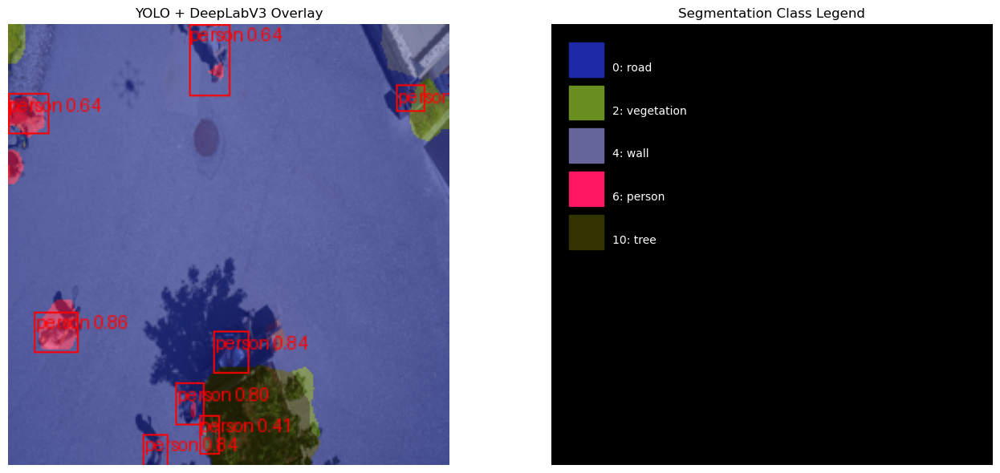

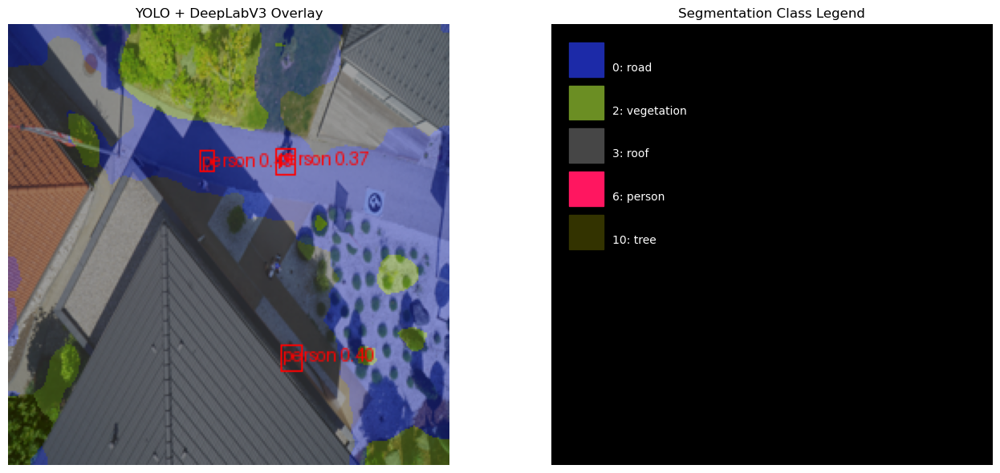

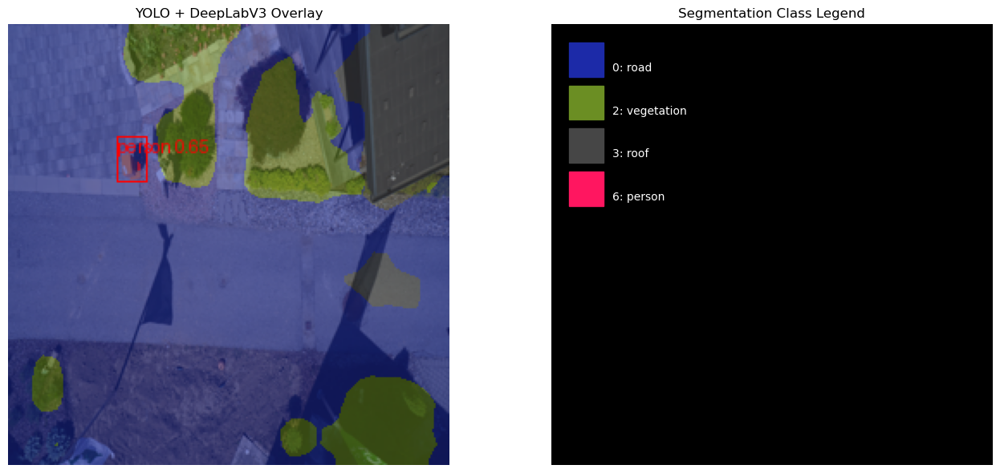

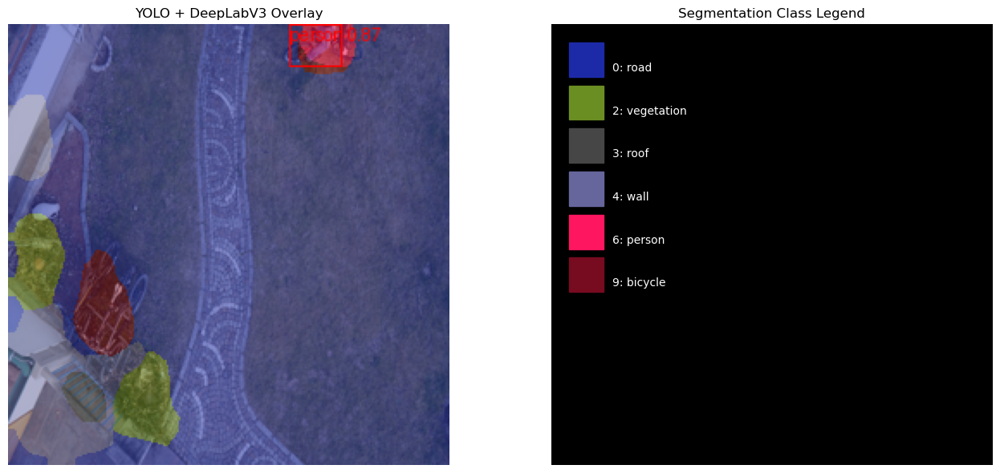

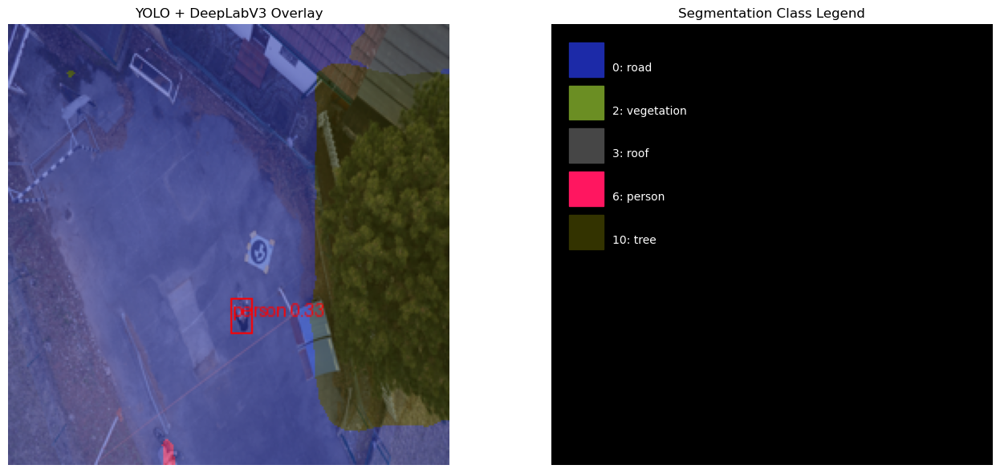

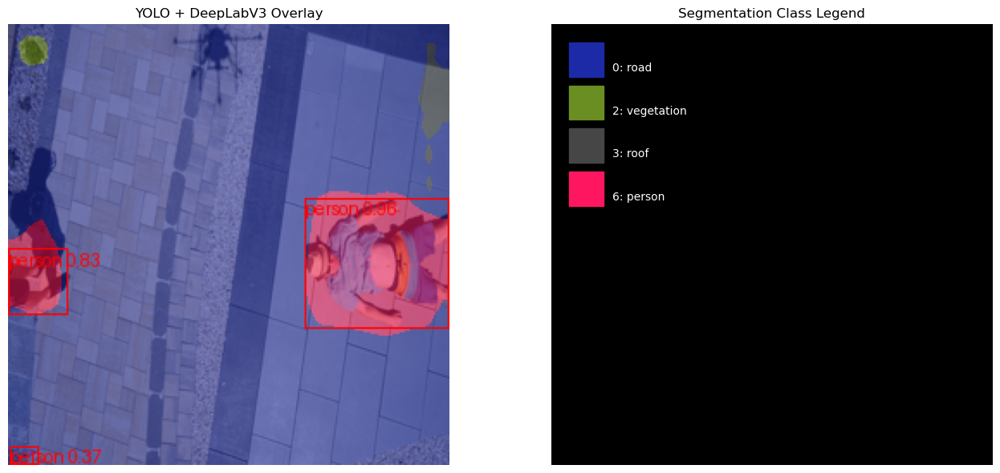

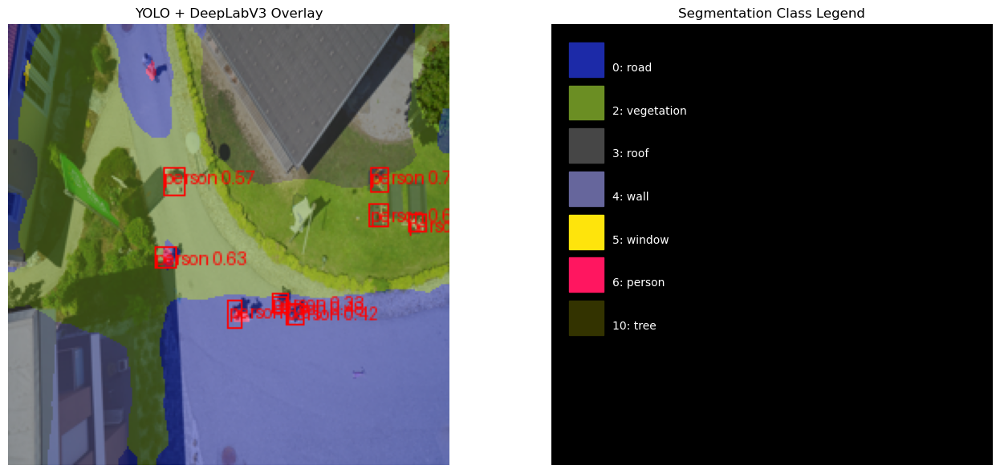

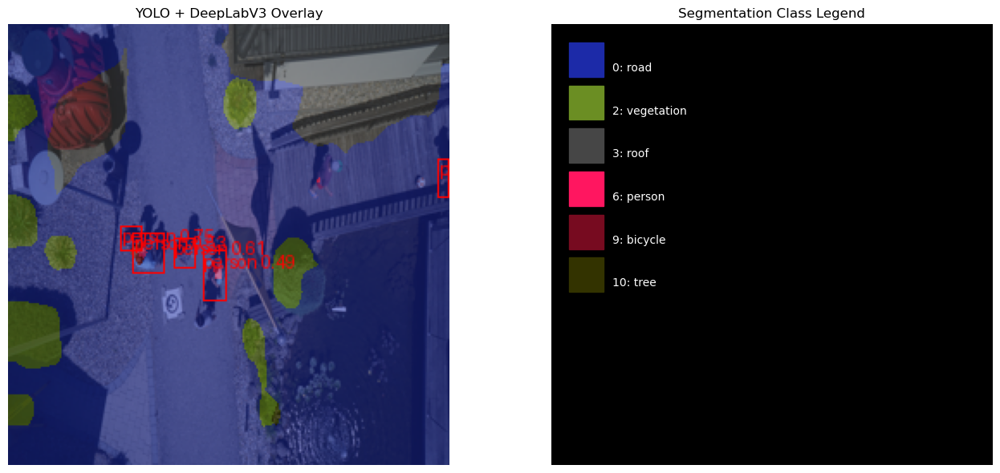

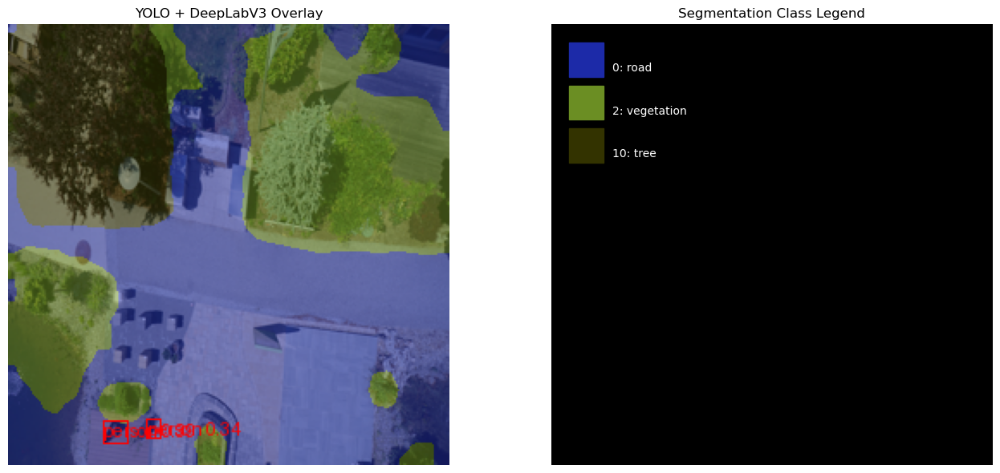

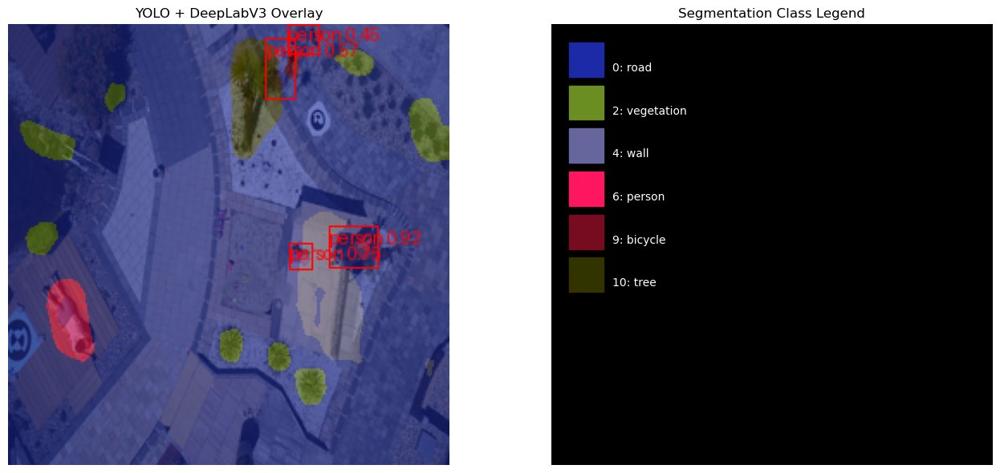

In [2]:
import torch
import torch.nn as nn
import torchvision.models.segmentation as segmentation
import torchvision.transforms as transforms
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import numpy as np
import os
from ultralytics import YOLO

%matplotlib inline


# ---------- Class Mapping ----------
class_id_to_name = {
    0: ('road', [28, 42, 168]),
    1: ('pool', [0, 50, 89]),
    2: ('vegetation', [107, 142, 35]),
    3: ('roof', [70, 70, 70]),
    4: ('wall', [102, 102, 156]),
    5: ('window', [254, 228, 12]),
    6: ('person', [255, 22, 96]),
    7: ('dog', [102, 51, 0]),
    8: ('car', [9, 143, 150]),
    9: ('bicycle', [119, 11, 32]),
    10: ('tree', [51, 51, 0]),
}

# Convert to color and name maps
class_colors = {k: tuple(np.array(v[1]) / 255.0) for k, v in class_id_to_name.items()}
class_names = {k: v[0] for k, v in class_id_to_name.items()}

# ---------- Load Models ----------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load DeepLabV3
deeplabv3_model = segmentation.deeplabv3_resnet101(pretrained=False)
deeplabv3_model.classifier[4] = nn.Conv2d(256, 11, kernel_size=(1, 1))  # 11 classes
state_dict = torch.load('deeplabv3_model.pth', map_location=device)
deeplabv3_model.load_state_dict(state_dict, strict=False)
deeplabv3_model.to(device).eval()

# Load YOLO
yolo_model = YOLO(best_pt_path)  # Replace with your model path

# ---------- Prediction Function ----------
def predict_and_visualize(image_path):
    # Load and resize image
    original_image = Image.open(image_path).convert("RGB")
    resized_image = original_image.resize((256, 256))
    
    # Transform for DeepLabV3
    transform = transforms.ToTensor()
    input_tensor = transform(resized_image).unsqueeze(0).to(device)

    # DeepLabV3 prediction
    with torch.no_grad():
        output = deeplabv3_model(input_tensor)['out']
        seg_mask = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

    # Convert segmentation mask to RGB using class colors
    seg_rgb = np.zeros((256, 256, 3), dtype=np.uint8)
    for cls_id, color in class_colors.items():
        seg_rgb[seg_mask == cls_id] = (np.array(color) * 255).astype(np.uint8)

    seg_overlay = Image.fromarray(seg_rgb)
    blended = Image.blend(resized_image, seg_overlay, alpha=0.5)
    draw = ImageDraw.Draw(blended)

    # YOLO Detection
    temp_path = "temp_resized.jpg"
    resized_image.save(temp_path)
    yolo_result = yolo_model.predict(source=temp_path, conf=0.3, save=False, verbose=False)[0]
    os.remove(temp_path)

    boxes = yolo_result.boxes
    labels = yolo_result.names

    # Draw YOLO boxes
    for i in range(len(boxes)):
        box = boxes.xyxy[i].cpu().numpy()
        cls_id = int(boxes.cls[i])
        conf = float(boxes.conf[i])
        label = f"{labels[cls_id]} {conf:.2f}"
        draw.rectangle(box, outline="red", width=1)
        draw.text((box[0], box[1]), label, fill="red")

    # Plotting
    fig, axs = plt.subplots(1, 2, figsize=(14, 6))
    axs[0].imshow(blended)
    axs[0].set_title("YOLO + DeepLabV3 Overlay")
    axs[0].axis("off")

    # Segmentation Legend (ID + name only)
    axs[1].imshow(np.zeros((256, 256, 3), dtype=np.uint8))
    axs[1].axis("off")
    axs[1].set_title("Segmentation Class Legend")
    for idx, cls_id in enumerate(np.unique(seg_mask)):
        color = class_colors.get(cls_id, (1, 1, 1))
        label = f"{cls_id}: {class_names.get(cls_id, 'unknown')}"
        axs[1].add_patch(plt.Rectangle((10, 10 + idx * 25), 20, 20, color=color))
        axs[1].text(35, 25 + idx * 25, label, fontsize=10, va='center', color="white")

    plt.tight_layout()
    plt.show()

# ---------- Run ----------
test_dir = "./datasets/suitable-dataset/val/images"
test_images = sorted(os.listdir(test_dir))[:10]

for img_file in test_images:
    predict_and_visualize(os.path.join(test_dir, img_file))


# Predcition on videos and save the masks as frame wise

In [ ]:
import os
import cv2
import torch
import numpy as np
from PIL import Image
from ultralytics import YOLO
from torchvision import transforms, models
from tqdm import tqdm

# ================== CONFIG ==================
video_path = './video.mp4'
yolo_weights_path = best_pt_path  # <- Replace with your actual path
deeplabv3_weights_path = 'deeplabv3_model.pth'  # Path to DeepLabV3 weights

output_base = './video_outputs'
max_frames = None  # Set to None for full video

# ================== CLASS MAPPING ==================
class_id_to_name = {
    0: ('road', [28, 42, 168]),
    1: ('pool', [0, 50, 89]),
    2: ('vegetation', [107, 142, 35]),
    3: ('roof', [70, 70, 70]),
    4: ('wall', [102, 102, 156]),
    5: ('window', [254, 228, 12]),
    6: ('person', [255, 22, 96]),
    7: ('dog', [102, 51, 0]),
    8: ('car', [9, 143, 150]),
    9: ('bicycle', [119, 11, 32]),
    10: ('tree', [51, 51, 0]),
}
num_classes = len(class_id_to_name)
yolo_class_names = [class_id_to_name[i][0] for i in sorted(class_id_to_name)]

# ================== OUTPUT FOLDERS ==================
img_dir = os.path.join(output_base, 'images')
seg_dir = os.path.join(output_base, 'segmentation_mask')
label_dir = os.path.join(output_base, 'labels')
video_output_path = os.path.join(output_base, 'output_video.mp4')

os.makedirs(img_dir, exist_ok=True)
os.makedirs(seg_dir, exist_ok=True)
os.makedirs(label_dir, exist_ok=True)

# ================== DEVICE ==================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ================== LOAD MODELS ==================
yolo_model = YOLO(yolo_weights_path)

deeplab = models.segmentation.deeplabv3_resnet101(pretrained=False, num_classes=num_classes, aux_loss=True)
state_dict = torch.load(deeplabv3_weights_path, map_location=device)
for k in list(state_dict.keys()):
    if k.startswith("aux_classifier."):
        del state_dict[k]
deeplab.load_state_dict(state_dict, strict=False)
deeplab.to(device)
deeplab.eval()

# ================== IMAGE TRANSFORM ==================
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# ================== COLOR MASK ==================
def get_colored_mask(mask):
    color_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for cls_id, (_, color) in class_id_to_name.items():
        color_mask[mask == cls_id] = color
    return color_mask

# ================== VIDEO SETUP ==================
cap = cv2.VideoCapture(video_path)
frame_count = 0
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_output_path, fourcc, fps, (w, h))

pbar = tqdm(total=max_frames if max_frames else total_frames, desc="Processing", leave=False)

# ================== PROCESS ==================
while True:
    ret, frame = cap.read()
    if not ret or (max_frames is not None and frame_count >= max_frames):
        break

    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    pil_img = Image.fromarray(frame_rgb)

    # === Segmentation ===
    input_tensor = transform(pil_img).unsqueeze(0).to(device)
    with torch.no_grad():
        output = deeplab(input_tensor)['out']
        pred_mask = torch.argmax(output.squeeze(), dim=0).cpu().numpy()

    mask_resized = cv2.resize(pred_mask.astype(np.uint8), (w, h), interpolation=cv2.INTER_NEAREST)
    mask_colored = get_colored_mask(mask_resized)

    # === YOLO Detection ===
    results = yolo_model(frame)
    boxes = results[0].boxes.xyxy.cpu().numpy()
    class_ids = results[0].boxes.cls.cpu().numpy()

    for box, cls_id in zip(boxes, class_ids):
        x1, y1, x2, y2 = map(int, box)
        name = yolo_class_names[int(cls_id)] if int(cls_id) < len(yolo_class_names) else f"Class {int(cls_id)}"
        cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(frame, name, (x1, max(y1 - 10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 0), 2)

    # === Save Outputs ===
    out_img = os.path.join(img_dir, f'frame_{frame_count:04d}.jpg')
    out_mask = os.path.join(seg_dir, f'mask_{frame_count:04d}.png')
    out_label = os.path.join(label_dir, f'frame_{frame_count:04d}.txt')

    # Save original frame
    cv2.imwrite(out_img, frame_rgb[..., ::-1])  # RGB -> BGR

    # ✅ Save colored segmentation mask (fix)
    cv2.imwrite(out_mask, mask_colored)

    # Save YOLO labels
    with open(out_label, 'w') as f:
        for box, cls_id in zip(boxes, class_ids):
            x1, y1, x2, y2 = box
            w_box = x2 - x1
            h_box = y2 - y1
            cx = x1 + w_box / 2
            cy = y1 + h_box / 2
            cx /= w
            cy /= h
            w_box /= w
            h_box /= h
            f.write(f"{int(cls_id)} {cx:.6f} {cy:.6f} {w_box:.6f} {h_box:.6f}  # {yolo_class_names[int(cls_id)]}\n")

    # Write blended video (original + mask)
    blended = cv2.addWeighted(frame, 1.0, mask_colored, 0.5, 0)
    video_writer.write(blended)

    frame_count += 1
    pbar.update(1)

# ================== DONE ==================
cap.release()
video_writer.release()
pbar.close()

print(f"\nDone! Processed {frame_count} frames.")


c:\Users\sande\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\sande\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Processing:   0%|          | 0/176 [00:00<?, ?it/s]


0: 384x640 6 persons, 46.0ms
Speed: 2.0ms preprocess, 46.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:   1%|          | 1/176 [00:00<02:21,  1.23it/s]


0: 384x640 6 persons, 47.3ms
Speed: 2.2ms preprocess, 47.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:   1%|          | 2/176 [00:01<02:05,  1.39it/s]


0: 384x640 6 persons, 43.3ms
Speed: 1.4ms preprocess, 43.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:   2%|▏         | 3/176 [00:02<01:56,  1.48it/s]


0: 384x640 7 persons, 45.4ms
Speed: 2.0ms preprocess, 45.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:   2%|▏         | 4/176 [00:02<01:51,  1.55it/s]


0: 384x640 12 persons, 45.3ms
Speed: 1.9ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:   3%|▎         | 5/176 [00:03<01:48,  1.57it/s]


0: 384x640 11 persons, 44.1ms
Speed: 1.4ms preprocess, 44.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:   3%|▎         | 6/176 [00:03<01:46,  1.60it/s]


0: 384x640 8 persons, 44.6ms
Speed: 1.8ms preprocess, 44.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:   4%|▍         | 7/176 [00:04<01:44,  1.62it/s]


0: 384x640 7 persons, 40.9ms
Speed: 1.6ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:   5%|▍         | 8/176 [00:05<01:41,  1.66it/s]


0: 384x640 13 persons, 45.3ms
Speed: 1.6ms preprocess, 45.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:   5%|▌         | 9/176 [00:05<01:40,  1.66it/s]


0: 384x640 11 persons, 43.7ms
Speed: 2.0ms preprocess, 43.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:   6%|▌         | 10/176 [00:06<01:39,  1.66it/s]


0: 384x640 10 persons, 41.9ms
Speed: 1.5ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:   6%|▋         | 11/176 [00:06<01:39,  1.65it/s]


0: 384x640 9 persons, 42.9ms
Speed: 1.5ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:   7%|▋         | 12/176 [00:07<01:39,  1.64it/s]


0: 384x640 7 persons, 44.9ms
Speed: 2.0ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:   7%|▋         | 13/176 [00:08<01:37,  1.67it/s]


0: 384x640 8 persons, 43.3ms
Speed: 2.2ms preprocess, 43.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:   8%|▊         | 14/176 [00:08<01:36,  1.68it/s]


0: 384x640 10 persons, 43.1ms
Speed: 1.5ms preprocess, 43.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:   9%|▊         | 15/176 [00:09<01:34,  1.70it/s]


0: 384x640 7 persons, 41.4ms
Speed: 1.5ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:   9%|▉         | 16/176 [00:09<01:33,  1.72it/s]


0: 384x640 7 persons, 43.6ms
Speed: 1.5ms preprocess, 43.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  10%|▉         | 17/176 [00:10<01:32,  1.71it/s]


0: 384x640 10 persons, 42.8ms
Speed: 1.4ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  10%|█         | 18/176 [00:11<01:33,  1.68it/s]


0: 384x640 8 persons, 52.4ms
Speed: 1.7ms preprocess, 52.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


Processing:  11%|█         | 19/176 [00:11<01:33,  1.68it/s]


0: 384x640 7 persons, 42.9ms
Speed: 1.5ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  11%|█▏        | 20/176 [00:12<01:33,  1.67it/s]


0: 384x640 6 persons, 44.3ms
Speed: 1.4ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  12%|█▏        | 21/176 [00:12<01:31,  1.69it/s]


0: 384x640 4 persons, 43.2ms
Speed: 1.4ms preprocess, 43.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  12%|█▎        | 22/176 [00:13<01:29,  1.72it/s]


0: 384x640 3 persons, 44.2ms
Speed: 1.7ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  13%|█▎        | 23/176 [00:13<01:29,  1.72it/s]


0: 384x640 5 persons, 42.9ms
Speed: 1.6ms preprocess, 42.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  14%|█▎        | 24/176 [00:14<01:29,  1.70it/s]


0: 384x640 4 persons, 45.0ms
Speed: 2.1ms preprocess, 45.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  14%|█▍        | 25/176 [00:15<01:28,  1.70it/s]


0: 384x640 7 persons, 46.3ms
Speed: 2.2ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  15%|█▍        | 26/176 [00:15<01:29,  1.68it/s]


0: 384x640 7 persons, 46.2ms
Speed: 1.9ms preprocess, 46.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  15%|█▌        | 27/176 [00:16<01:29,  1.67it/s]


0: 384x640 8 persons, 40.5ms
Speed: 1.6ms preprocess, 40.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  16%|█▌        | 28/176 [00:16<01:28,  1.68it/s]


0: 384x640 6 persons, 43.1ms
Speed: 1.6ms preprocess, 43.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  16%|█▋        | 29/176 [00:17<01:28,  1.66it/s]


0: 384x640 6 persons, 42.0ms
Speed: 1.7ms preprocess, 42.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  17%|█▋        | 30/176 [00:18<01:27,  1.68it/s]


0: 384x640 4 persons, 43.9ms
Speed: 1.6ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  18%|█▊        | 31/176 [00:18<01:26,  1.69it/s]


0: 384x640 5 persons, 43.5ms
Speed: 1.6ms preprocess, 43.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  18%|█▊        | 32/176 [00:19<01:25,  1.69it/s]


0: 384x640 5 persons, 43.8ms
Speed: 1.6ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  19%|█▉        | 33/176 [00:19<01:25,  1.68it/s]


0: 384x640 4 persons, 42.6ms
Speed: 1.3ms preprocess, 42.6ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  19%|█▉        | 34/176 [00:20<01:24,  1.68it/s]


0: 384x640 7 persons, 37.5ms
Speed: 1.7ms preprocess, 37.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  20%|█▉        | 35/176 [00:21<01:23,  1.69it/s]


0: 384x640 4 persons, 42.8ms
Speed: 1.4ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  20%|██        | 36/176 [00:21<01:23,  1.68it/s]


0: 384x640 5 persons, 44.4ms
Speed: 2.2ms preprocess, 44.4ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  21%|██        | 37/176 [00:22<01:21,  1.70it/s]


0: 384x640 3 persons, 44.9ms
Speed: 2.0ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  22%|██▏       | 38/176 [00:22<01:20,  1.71it/s]


0: 384x640 5 persons, 42.7ms
Speed: 2.0ms preprocess, 42.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  22%|██▏       | 39/176 [00:23<01:20,  1.70it/s]


0: 384x640 4 persons, 54.3ms
Speed: 1.5ms preprocess, 54.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  23%|██▎       | 40/176 [00:24<01:19,  1.70it/s]


0: 384x640 5 persons, 42.2ms
Speed: 1.4ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  23%|██▎       | 41/176 [00:24<01:20,  1.68it/s]


0: 384x640 3 persons, 42.7ms
Speed: 1.5ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  24%|██▍       | 42/176 [00:25<01:19,  1.68it/s]


0: 384x640 3 persons, 41.8ms
Speed: 1.5ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  24%|██▍       | 43/176 [00:25<01:18,  1.69it/s]


0: 384x640 2 persons, 43.1ms
Speed: 2.0ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  25%|██▌       | 44/176 [00:26<01:17,  1.70it/s]


0: 384x640 2 persons, 46.2ms
Speed: 1.5ms preprocess, 46.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  26%|██▌       | 45/176 [00:26<01:16,  1.71it/s]


0: 384x640 4 persons, 42.0ms
Speed: 1.7ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  26%|██▌       | 46/176 [00:27<01:16,  1.71it/s]


0: 384x640 5 persons, 44.8ms
Speed: 2.0ms preprocess, 44.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  27%|██▋       | 47/176 [00:28<01:16,  1.69it/s]


0: 384x640 6 persons, 45.5ms
Speed: 1.5ms preprocess, 45.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  27%|██▋       | 48/176 [00:28<01:15,  1.69it/s]


0: 384x640 4 persons, 44.2ms
Speed: 1.4ms preprocess, 44.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  28%|██▊       | 49/176 [00:29<01:14,  1.70it/s]


0: 384x640 4 persons, 40.2ms
Speed: 1.6ms preprocess, 40.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  28%|██▊       | 50/176 [00:29<01:13,  1.71it/s]


0: 384x640 4 persons, 41.6ms
Speed: 1.4ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  29%|██▉       | 51/176 [00:30<01:13,  1.70it/s]


0: 384x640 3 persons, 43.4ms
Speed: 2.0ms preprocess, 43.4ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  30%|██▉       | 52/176 [00:31<01:13,  1.69it/s]


0: 384x640 4 persons, 41.3ms
Speed: 1.4ms preprocess, 41.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  30%|███       | 53/176 [00:31<01:12,  1.69it/s]


0: 384x640 3 persons, 41.3ms
Speed: 1.4ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  31%|███       | 54/176 [00:32<01:11,  1.70it/s]


0: 384x640 3 persons, 41.4ms
Speed: 1.4ms preprocess, 41.4ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  31%|███▏      | 55/176 [00:32<01:11,  1.70it/s]


0: 384x640 2 persons, 62.5ms
Speed: 1.4ms preprocess, 62.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  32%|███▏      | 56/176 [00:33<01:10,  1.70it/s]


0: 384x640 3 persons, 41.0ms
Speed: 1.7ms preprocess, 41.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  32%|███▏      | 57/176 [00:34<01:09,  1.70it/s]


0: 384x640 2 persons, 47.7ms
Speed: 1.4ms preprocess, 47.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  33%|███▎      | 58/176 [00:34<01:09,  1.70it/s]


0: 384x640 2 persons, 44.4ms
Speed: 2.0ms preprocess, 44.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  34%|███▎      | 59/176 [00:35<01:09,  1.69it/s]


0: 384x640 3 persons, 40.3ms
Speed: 1.4ms preprocess, 40.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  34%|███▍      | 60/176 [00:35<01:08,  1.69it/s]


0: 384x640 4 persons, 41.9ms
Speed: 1.4ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  35%|███▍      | 61/176 [00:36<01:08,  1.68it/s]


0: 384x640 7 persons, 44.3ms
Speed: 1.6ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  35%|███▌      | 62/176 [00:37<01:07,  1.69it/s]


0: 384x640 1 person, 39.0ms
Speed: 1.4ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  36%|███▌      | 63/176 [00:37<01:06,  1.69it/s]


0: 384x640 3 persons, 44.7ms
Speed: 1.7ms preprocess, 44.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  36%|███▋      | 64/176 [00:38<01:06,  1.68it/s]


0: 384x640 5 persons, 44.3ms
Speed: 1.7ms preprocess, 44.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  37%|███▋      | 65/176 [00:38<01:06,  1.68it/s]


0: 384x640 3 persons, 45.3ms
Speed: 2.0ms preprocess, 45.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  38%|███▊      | 66/176 [00:39<01:06,  1.66it/s]


0: 384x640 5 persons, 41.7ms
Speed: 1.4ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  38%|███▊      | 67/176 [00:40<01:05,  1.67it/s]


0: 384x640 5 persons, 41.6ms
Speed: 1.4ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  39%|███▊      | 68/176 [00:40<01:04,  1.68it/s]


0: 384x640 6 persons, 44.5ms
Speed: 1.6ms preprocess, 44.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  39%|███▉      | 69/176 [00:41<01:03,  1.68it/s]


0: 384x640 7 persons, 43.6ms
Speed: 2.0ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  40%|███▉      | 70/176 [00:41<01:02,  1.69it/s]


0: 384x640 6 persons, 51.1ms
Speed: 1.7ms preprocess, 51.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


Processing:  40%|████      | 71/176 [00:42<01:02,  1.68it/s]


0: 384x640 6 persons, 41.9ms
Speed: 1.5ms preprocess, 41.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  41%|████      | 72/176 [00:42<01:01,  1.69it/s]


0: 384x640 4 persons, 44.2ms
Speed: 1.8ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  41%|████▏     | 73/176 [00:43<01:00,  1.69it/s]


0: 384x640 4 persons, 43.9ms
Speed: 1.4ms preprocess, 43.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  42%|████▏     | 74/176 [00:44<01:00,  1.68it/s]


0: 384x640 3 persons, 42.3ms
Speed: 1.4ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  43%|████▎     | 75/176 [00:44<01:00,  1.66it/s]


0: 384x640 3 persons, 42.8ms
Speed: 2.1ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  43%|████▎     | 76/176 [00:45<00:59,  1.68it/s]


0: 384x640 3 persons, 44.5ms
Speed: 1.6ms preprocess, 44.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


Processing:  44%|████▍     | 77/176 [00:45<00:59,  1.67it/s]


0: 384x640 3 persons, 37.6ms
Speed: 1.7ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  44%|████▍     | 78/176 [00:46<00:58,  1.68it/s]


0: 384x640 4 persons, 41.9ms
Speed: 1.4ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  45%|████▍     | 79/176 [00:47<00:58,  1.66it/s]


0: 384x640 4 persons, 41.6ms
Speed: 1.5ms preprocess, 41.6ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  45%|████▌     | 80/176 [00:47<00:57,  1.66it/s]


0: 384x640 6 persons, 40.2ms
Speed: 1.4ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  46%|████▌     | 81/176 [00:48<00:56,  1.68it/s]


0: 384x640 5 persons, 44.2ms
Speed: 1.5ms preprocess, 44.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  47%|████▋     | 82/176 [00:48<00:55,  1.70it/s]


0: 384x640 4 persons, 43.6ms
Speed: 1.4ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  47%|████▋     | 83/176 [00:49<00:54,  1.70it/s]


0: 384x640 5 persons, 40.1ms
Speed: 1.4ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  48%|████▊     | 84/176 [00:50<00:54,  1.70it/s]


0: 384x640 5 persons, 43.3ms
Speed: 1.5ms preprocess, 43.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  48%|████▊     | 85/176 [00:50<00:53,  1.69it/s]


0: 384x640 5 persons, 44.2ms
Speed: 1.5ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  49%|████▉     | 86/176 [00:51<00:54,  1.66it/s]


0: 384x640 5 persons, 42.7ms
Speed: 1.6ms preprocess, 42.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  49%|████▉     | 87/176 [00:51<00:53,  1.66it/s]


0: 384x640 5 persons, 40.4ms
Speed: 1.4ms preprocess, 40.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  50%|█████     | 88/176 [00:52<00:53,  1.66it/s]


0: 384x640 6 persons, 44.0ms
Speed: 1.8ms preprocess, 44.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  51%|█████     | 89/176 [00:53<00:52,  1.66it/s]


0: 384x640 5 persons, 42.3ms
Speed: 1.8ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  51%|█████     | 90/176 [00:53<00:51,  1.67it/s]


0: 384x640 4 persons, 43.5ms
Speed: 1.4ms preprocess, 43.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  52%|█████▏    | 91/176 [00:54<00:50,  1.67it/s]


0: 384x640 5 persons, 43.6ms
Speed: 1.5ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  52%|█████▏    | 92/176 [00:54<00:50,  1.68it/s]


0: 384x640 6 persons, 46.0ms
Speed: 1.4ms preprocess, 46.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  53%|█████▎    | 93/176 [00:55<00:50,  1.65it/s]


0: 384x640 7 persons, 39.9ms
Speed: 1.5ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  53%|█████▎    | 94/176 [00:56<00:49,  1.66it/s]


0: 384x640 7 persons, 44.4ms
Speed: 1.9ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  54%|█████▍    | 95/176 [00:56<00:48,  1.66it/s]


0: 384x640 5 persons, 42.2ms
Speed: 1.4ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  55%|█████▍    | 96/176 [00:57<00:47,  1.67it/s]


0: 384x640 4 persons, 44.5ms
Speed: 1.5ms preprocess, 44.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  55%|█████▌    | 97/176 [00:57<00:47,  1.66it/s]


0: 384x640 4 persons, 42.8ms
Speed: 2.0ms preprocess, 42.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  56%|█████▌    | 98/176 [00:58<00:47,  1.66it/s]


0: 384x640 4 persons, 41.5ms
Speed: 1.6ms preprocess, 41.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  56%|█████▋    | 99/176 [00:59<00:46,  1.66it/s]


0: 384x640 2 persons, 43.7ms
Speed: 2.1ms preprocess, 43.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  57%|█████▋    | 100/176 [00:59<00:46,  1.65it/s]


0: 384x640 3 persons, 50.6ms
Speed: 1.7ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  57%|█████▋    | 101/176 [01:00<00:45,  1.65it/s]


0: 384x640 2 persons, 40.3ms
Speed: 1.7ms preprocess, 40.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  58%|█████▊    | 102/176 [01:00<00:44,  1.66it/s]


0: 384x640 3 persons, 41.3ms
Speed: 1.4ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  59%|█████▊    | 103/176 [01:01<00:44,  1.66it/s]


0: 384x640 2 persons, 41.9ms
Speed: 1.7ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  59%|█████▉    | 104/176 [01:02<00:43,  1.66it/s]


0: 384x640 3 persons, 42.7ms
Speed: 1.4ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  60%|█████▉    | 105/176 [01:02<00:42,  1.68it/s]


0: 384x640 6 persons, 42.8ms
Speed: 1.8ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  60%|██████    | 106/176 [01:03<00:41,  1.69it/s]


0: 384x640 5 persons, 42.2ms
Speed: 1.4ms preprocess, 42.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  61%|██████    | 107/176 [01:03<00:40,  1.69it/s]


0: 384x640 4 persons, 42.0ms
Speed: 1.5ms preprocess, 42.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  61%|██████▏   | 108/176 [01:04<00:40,  1.70it/s]


0: 384x640 5 persons, 41.0ms
Speed: 1.8ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  62%|██████▏   | 109/176 [01:05<00:39,  1.71it/s]


0: 384x640 4 persons, 42.9ms
Speed: 1.7ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  62%|██████▎   | 110/176 [01:05<00:38,  1.71it/s]


0: 384x640 5 persons, 45.2ms
Speed: 2.1ms preprocess, 45.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  63%|██████▎   | 111/176 [01:06<00:38,  1.70it/s]


0: 384x640 4 persons, 41.0ms
Speed: 1.5ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  64%|██████▎   | 112/176 [01:06<00:37,  1.70it/s]


0: 384x640 4 persons, 42.3ms
Speed: 1.4ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  64%|██████▍   | 113/176 [01:07<00:36,  1.71it/s]


0: 384x640 5 persons, 40.7ms
Speed: 1.5ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  65%|██████▍   | 114/176 [01:08<00:36,  1.69it/s]


0: 384x640 5 persons, 43.3ms
Speed: 1.6ms preprocess, 43.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  65%|██████▌   | 115/176 [01:08<00:35,  1.70it/s]


0: 384x640 4 persons, 40.0ms
Speed: 1.5ms preprocess, 40.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  66%|██████▌   | 116/176 [01:09<00:35,  1.70it/s]


0: 384x640 9 persons, 42.8ms
Speed: 1.6ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  66%|██████▋   | 117/176 [01:09<00:34,  1.70it/s]


0: 384x640 7 persons, 41.8ms
Speed: 2.0ms preprocess, 41.8ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  67%|██████▋   | 118/176 [01:10<00:33,  1.71it/s]


0: 384x640 6 persons, 42.2ms
Speed: 1.4ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  68%|██████▊   | 119/176 [01:10<00:33,  1.71it/s]


0: 384x640 6 persons, 44.9ms
Speed: 2.1ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  68%|██████▊   | 120/176 [01:11<00:32,  1.72it/s]


0: 384x640 5 persons, 43.6ms
Speed: 1.5ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  69%|██████▉   | 121/176 [01:12<00:32,  1.70it/s]


0: 384x640 7 persons, 41.3ms
Speed: 1.6ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  69%|██████▉   | 122/176 [01:12<00:31,  1.72it/s]


0: 384x640 5 persons, 41.8ms
Speed: 1.5ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  70%|██████▉   | 123/176 [01:13<00:30,  1.73it/s]


0: 384x640 7 persons, 41.3ms
Speed: 2.2ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  70%|███████   | 124/176 [01:13<00:30,  1.73it/s]


0: 384x640 6 persons, 41.6ms
Speed: 1.7ms preprocess, 41.6ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  71%|███████   | 125/176 [01:14<00:29,  1.71it/s]


0: 384x640 9 persons, 42.9ms
Speed: 2.0ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  72%|███████▏  | 126/176 [01:15<00:29,  1.70it/s]


0: 384x640 5 persons, 41.4ms
Speed: 1.6ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  72%|███████▏  | 127/176 [01:15<00:28,  1.71it/s]


0: 384x640 7 persons, 43.7ms
Speed: 1.5ms preprocess, 43.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  73%|███████▎  | 128/176 [01:16<00:28,  1.68it/s]


0: 384x640 7 persons, 43.5ms
Speed: 1.5ms preprocess, 43.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  73%|███████▎  | 129/176 [01:16<00:27,  1.72it/s]


0: 384x640 6 persons, 42.3ms
Speed: 2.1ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  74%|███████▍  | 130/176 [01:17<00:26,  1.72it/s]


0: 384x640 6 persons, 43.1ms
Speed: 1.4ms preprocess, 43.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  74%|███████▍  | 131/176 [01:17<00:26,  1.72it/s]


0: 384x640 5 persons, 41.9ms
Speed: 1.7ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  75%|███████▌  | 132/176 [01:18<00:25,  1.72it/s]


0: 384x640 7 persons, 41.7ms
Speed: 2.0ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  76%|███████▌  | 133/176 [01:19<00:25,  1.71it/s]


0: 384x640 6 persons, 41.9ms
Speed: 1.7ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  76%|███████▌  | 134/176 [01:19<00:24,  1.73it/s]


0: 384x640 7 persons, 42.8ms
Speed: 1.6ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  77%|███████▋  | 135/176 [01:20<00:24,  1.69it/s]


0: 384x640 6 persons, 42.3ms
Speed: 1.4ms preprocess, 42.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  77%|███████▋  | 136/176 [01:20<00:23,  1.70it/s]


0: 384x640 6 persons, 42.4ms
Speed: 1.7ms preprocess, 42.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  78%|███████▊  | 137/176 [01:21<00:22,  1.70it/s]


0: 384x640 8 persons, 40.9ms
Speed: 1.7ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  78%|███████▊  | 138/176 [01:22<00:22,  1.68it/s]


0: 384x640 6 persons, 38.6ms
Speed: 1.4ms preprocess, 38.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  79%|███████▉  | 139/176 [01:22<00:21,  1.68it/s]


0: 384x640 8 persons, 41.5ms
Speed: 2.0ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  80%|███████▉  | 140/176 [01:23<00:21,  1.69it/s]


0: 384x640 8 persons, 41.4ms
Speed: 1.5ms preprocess, 41.4ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  80%|████████  | 141/176 [01:23<00:20,  1.69it/s]


0: 384x640 8 persons, 43.2ms
Speed: 1.5ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  81%|████████  | 142/176 [01:24<00:20,  1.67it/s]


0: 384x640 9 persons, 41.5ms
Speed: 1.5ms preprocess, 41.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  81%|████████▏ | 143/176 [01:25<00:19,  1.68it/s]


0: 384x640 9 persons, 42.7ms
Speed: 1.4ms preprocess, 42.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  82%|████████▏ | 144/176 [01:25<00:19,  1.66it/s]


0: 384x640 5 persons, 44.2ms
Speed: 1.7ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  82%|████████▏ | 145/176 [01:26<00:18,  1.66it/s]


0: 384x640 8 persons, 44.2ms
Speed: 1.5ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  83%|████████▎ | 146/176 [01:26<00:18,  1.65it/s]


0: 384x640 6 persons, 43.4ms
Speed: 1.4ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  84%|████████▎ | 147/176 [01:27<00:17,  1.65it/s]


0: 384x640 7 persons, 55.8ms
Speed: 2.1ms preprocess, 55.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  84%|████████▍ | 148/176 [01:28<00:17,  1.62it/s]


0: 384x640 5 persons, 44.1ms
Speed: 1.5ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  85%|████████▍ | 149/176 [01:28<00:17,  1.55it/s]


0: 384x640 7 persons, 70.1ms
Speed: 3.6ms preprocess, 70.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  85%|████████▌ | 150/176 [01:29<00:17,  1.51it/s]


0: 384x640 5 persons, 79.5ms
Speed: 2.8ms preprocess, 79.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


Processing:  86%|████████▌ | 151/176 [01:30<00:18,  1.37it/s]


0: 384x640 8 persons, 98.2ms
Speed: 3.3ms preprocess, 98.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


Processing:  86%|████████▋ | 152/176 [01:31<00:20,  1.18it/s]


0: 384x640 7 persons, 71.3ms
Speed: 2.2ms preprocess, 71.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


Processing:  87%|████████▋ | 153/176 [01:32<00:19,  1.18it/s]


0: 384x640 8 persons, 76.1ms
Speed: 3.0ms preprocess, 76.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


Processing:  88%|████████▊ | 154/176 [01:33<00:18,  1.19it/s]


0: 384x640 7 persons, 52.2ms
Speed: 2.3ms preprocess, 52.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


Processing:  88%|████████▊ | 155/176 [01:34<00:17,  1.18it/s]


0: 384x640 8 persons, 64.8ms
Speed: 2.3ms preprocess, 64.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  89%|████████▊ | 156/176 [01:34<00:15,  1.26it/s]


0: 384x640 9 persons, 45.3ms
Speed: 2.0ms preprocess, 45.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  89%|████████▉ | 157/176 [01:35<00:14,  1.33it/s]


0: 384x640 9 persons, 45.9ms
Speed: 1.9ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  90%|████████▉ | 158/176 [01:36<00:12,  1.40it/s]


0: 384x640 10 persons, 45.3ms
Speed: 1.9ms preprocess, 45.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  90%|█████████ | 159/176 [01:36<00:11,  1.46it/s]


0: 384x640 8 persons, 45.9ms
Speed: 1.7ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  91%|█████████ | 160/176 [01:37<00:10,  1.51it/s]


0: 384x640 9 persons, 45.1ms
Speed: 2.0ms preprocess, 45.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


Processing:  91%|█████████▏| 161/176 [01:37<00:09,  1.53it/s]


0: 384x640 6 persons, 44.1ms
Speed: 1.9ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  92%|█████████▏| 162/176 [01:38<00:09,  1.55it/s]


0: 384x640 7 persons, 42.8ms
Speed: 1.5ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  93%|█████████▎| 163/176 [01:39<00:08,  1.58it/s]


0: 384x640 6 persons, 42.9ms
Speed: 1.9ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


Processing:  93%|█████████▎| 164/176 [01:39<00:07,  1.61it/s]


0: 384x640 4 persons, 42.9ms
Speed: 1.6ms preprocess, 42.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  94%|█████████▍| 165/176 [01:40<00:06,  1.63it/s]


0: 384x640 4 persons, 43.4ms
Speed: 1.4ms preprocess, 43.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  94%|█████████▍| 166/176 [01:40<00:06,  1.64it/s]


0: 384x640 6 persons, 43.1ms
Speed: 1.5ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  95%|█████████▍| 167/176 [01:41<00:05,  1.65it/s]


0: 384x640 5 persons, 42.4ms
Speed: 1.4ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  95%|█████████▌| 168/176 [01:42<00:04,  1.67it/s]


0: 384x640 7 persons, 43.8ms
Speed: 1.6ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  96%|█████████▌| 169/176 [01:42<00:04,  1.69it/s]


0: 384x640 5 persons, 45.0ms
Speed: 2.1ms preprocess, 45.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  97%|█████████▋| 170/176 [01:43<00:03,  1.69it/s]


0: 384x640 5 persons, 43.2ms
Speed: 1.5ms preprocess, 43.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


Processing:  97%|█████████▋| 171/176 [01:43<00:02,  1.69it/s]


0: 384x640 6 persons, 41.9ms
Speed: 1.4ms preprocess, 41.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


Processing:  98%|█████████▊| 172/176 [01:44<00:02,  1.69it/s]


0: 384x640 6 persons, 45.0ms
Speed: 1.9ms preprocess, 45.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  98%|█████████▊| 173/176 [01:45<00:01,  1.66it/s]


0: 384x640 6 persons, 42.0ms
Speed: 1.8ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Processing:  99%|█████████▉| 174/176 [01:45<00:01,  1.68it/s]


0: 384x640 5 persons, 43.0ms
Speed: 1.6ms preprocess, 43.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


Processing:  99%|█████████▉| 175/176 [01:46<00:00,  1.67it/s]


0: 384x640 6 persons, 42.8ms
Speed: 2.0ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



✅ Done! Processed 176 frames.
📁 Original frames:     ./video_outputs\images
📁 Segmentation masks: ./video_outputs\segmentation_mask
📁 YOLO labels:         ./video_outputs\labels
🎥 Output video:        ./video_outputs\output_video.mp4


# Eval;aute

In [ ]:
import os
import numpy as np
import cv2
from tqdm import tqdm
from sklearn.metrics import average_precision_score
from collections import defaultdict

# ================== CONFIGURATION ==================
ground_truth_labels_dir = './ground_truth/labels'  # Path to ground truth labels
ground_truth_masks_dir = './ground_truth/masks'   # Path to ground truth masks
predicted_labels_dir = './video_outputs/labels'   # Path to predicted labels
predicted_masks_dir = './video_outputs/masks'     # Path to predicted masks

iou_threshold = 0.5  # IoU threshold for object detection evaluation
max_frames = 10      # Set to None for full evaluation

# ================== EVALUATE OBJECT DETECTION (YOLO-style) ==================

def calculate_iou(box1, box2):
    """
    Calculate IoU between two bounding boxes.
    Box format: [x1, y1, x2, y2]
    """
    x1, y1, x2, y2 = box1
    x1p, y1p, x2p, y2p = box2

    # Calculate intersection
    ix1 = max(x1, x1p)
    iy1 = max(y1, y1p)
    ix2 = min(x2, x2p)
    iy2 = min(y2, y2p)

    iw = max(0, ix2 - ix1)
    ih = max(0, iy2 - iy1)

    intersection = iw * ih
    area_box1 = (x2 - x1) * (y2 - y1)
    area_box2 = (x2p - x1p) * (y2p - y1p)

    union = area_box1 + area_box2 - intersection
    iou = intersection / union if union > 0 else 0

    return iou

def evaluate_object_detection():
    pred_files = sorted(os.listdir(predicted_labels_dir))[:max_frames]
    gt_files = sorted(os.listdir(ground_truth_labels_dir))[:max_frames]

    iou_scores = []
    for pred_file, gt_file in zip(pred_files, gt_files):
        pred_boxes = []
        gt_boxes = []

        # Read predicted labels
        with open(os.path.join(predicted_labels_dir, pred_file), 'r') as f:
            for line in f:
                cls, cx, cy, w, h = map(float, line.strip().split())
                x1 = (cx - w / 2)
                y1 = (cy - h / 2)
                x2 = (cx + w / 2)
                y2 = (cy + h / 2)
                pred_boxes.append([x1, y1, x2, y2])

        # Read ground truth labels
        with open(os.path.join(ground_truth_labels_dir, gt_file), 'r') as f:
            for line in f:
                cls, cx, cy, w, h = map(float, line.strip().split())
                x1 = (cx - w / 2)
                y1 = (cy - h / 2)
                x2 = (cx + w / 2)
                y2 = (cy + h / 2)
                gt_boxes.append([x1, y1, x2, y2])

        # Calculate IoU for each pair of predicted and ground truth boxes
        for pred_box in pred_boxes:
            iou_max = 0
            for gt_box in gt_boxes:
                iou = calculate_iou(pred_box, gt_box)
                if iou > iou_max:
                    iou_max = iou
            if iou_max >= iou_threshold:
                iou_scores.append(iou_max)

    mean_iou = np.mean(iou_scores) if iou_scores else 0
    print(f"Mean IoU for Object Detection: {mean_iou:.4f}")

# ================== EVALUATE SEGMENTATION (U-Net masks) ==================

def calculate_segmentation_iou(pred_mask, gt_mask):
    """
    Calculate IoU for segmentation masks.
    """
    intersection = np.sum((pred_mask == 1) & (gt_mask == 1))
    union = np.sum((pred_mask == 1) | (gt_mask == 1))
    iou = intersection / union if union > 0 else 0
    return iou

def evaluate_segmentation():
    pred_files = sorted(os.listdir(predicted_masks_dir))[:max_frames]
    gt_files = sorted(os.listdir(ground_truth_masks_dir))[:max_frames]

    iou_scores = []
    for pred_file, gt_file in zip(pred_files, gt_files):
        # Read predicted mask
        pred_mask = cv2.imread(os.path.join(predicted_masks_dir, pred_file), cv2.IMREAD_GRAYSCALE)
        pred_mask = (pred_mask > 127).astype(np.uint8)  # Thresholding to binary mask

        # Read ground truth mask
        gt_mask = cv2.imread(os.path.join(ground_truth_masks_dir, gt_file), cv2.IMREAD_GRAYSCALE)
        gt_mask = (gt_mask > 127).astype(np.uint8)  # Thresholding to binary mask

        # Calculate IoU for the mask
        iou = calculate_segmentation_iou(pred_mask, gt_mask)
        iou_scores.append(iou)

    mean_iou = np.mean(iou_scores) if iou_scores else 0
    print(f"Mean IoU for Segmentation: {mean_iou:.4f}")

# ================== MAIN EVALUATION PIPELINE ==================

def evaluate():
    print("Evaluating Object Detection...")
    evaluate_object_detection()
    
    print("\nEvaluating Segmentation...")
    evaluate_segmentation()

# Run evaluation
evaluate()


# 